In [5]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: []


In [2]:
# Importing necessary libraries
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Ensure reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [4]:
# Generator Code:
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Input(shape=(100,)))
    model.add(layers.Dense(8*8*256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh'))

    return model

In [5]:
# Discriminator Code:
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Input(shape=[64, 64, 3]))
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

In [6]:
# Losses:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [7]:
# Optimizers:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [8]:
# Loading the dataset:
(train_images, _), (_, _) = tf.keras.datasets.cifar10.load_data()

train_images = train_images.astype('float32')
train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]

# Resize images to 64x64
train_images = tf.image.resize(train_images, [64, 64])

BUFFER_SIZE = 60000
BATCH_SIZE = 256

train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

170498071/170498071 [==============================] - 13s 0us/step


In [9]:
# The training loop:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

generator = build_generator()
discriminator = build_discriminator()

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

gen_losses = []
disc_losses = []

def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            gen_losses.append(gen_loss)
            disc_losses.append(disc_loss)

        print(f'Epoch {epoch+1}, Gen Loss: {gen_loss}, Disc Loss: {disc_loss}')

        generate_and_save_images(generator, epoch + 1, seed)

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i, :, :, :] + 1) / 2)
        plt.axis('off')

    os.makedirs('output_images', exist_ok=True)
    plt.savefig(f'output_images/image_at_epoch_{epoch:04d}.png')
    plt.show()

Epoch 1, Gen Loss: 11.613303184509277, Disc Loss: 0.23325969278812408


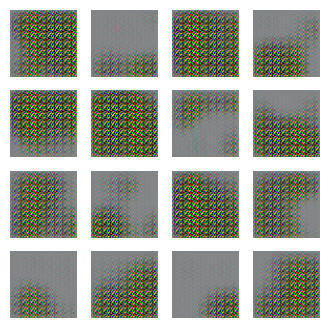

Epoch 2, Gen Loss: 4.68575382232666, Disc Loss: 0.18861541152000427


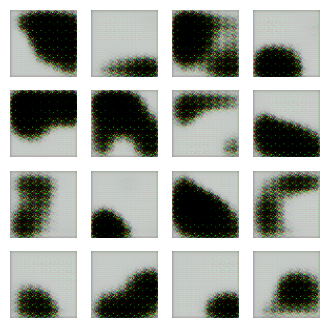

Epoch 3, Gen Loss: 6.279026985168457, Disc Loss: 0.08260737359523773


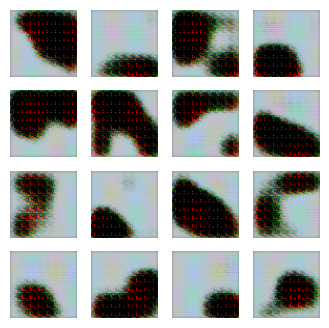

Epoch 4, Gen Loss: 5.979987621307373, Disc Loss: 0.14766278862953186


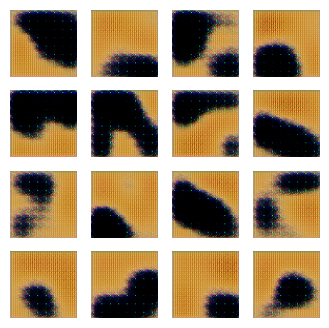

Epoch 5, Gen Loss: 5.515346527099609, Disc Loss: 0.03773500397801399


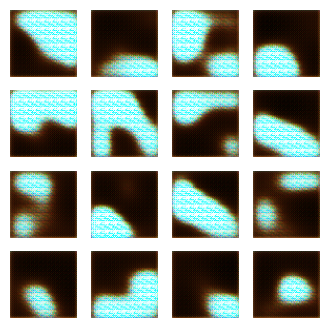

Epoch 6, Gen Loss: 6.164862632751465, Disc Loss: 0.05957706645131111


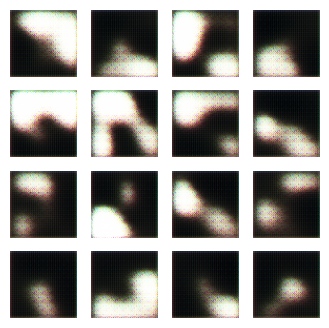

Epoch 7, Gen Loss: 6.107938289642334, Disc Loss: 0.01630198210477829


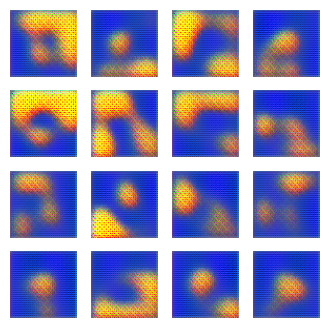

Epoch 8, Gen Loss: 4.677373886108398, Disc Loss: 0.13849011063575745


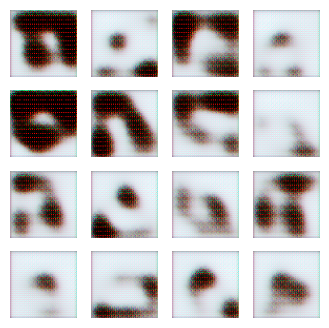

Epoch 9, Gen Loss: 2.852625846862793, Disc Loss: 0.45990192890167236


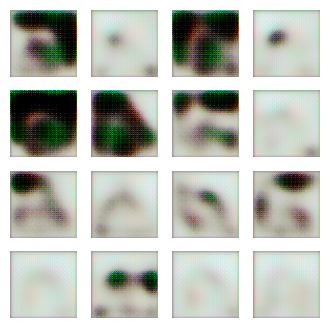

Epoch 10, Gen Loss: 4.11282205581665, Disc Loss: 0.3117327094078064


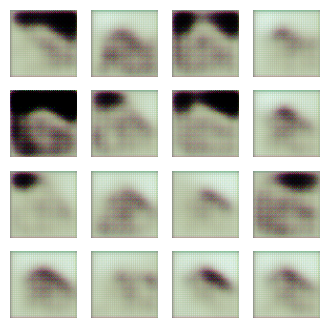

Epoch 11, Gen Loss: 3.235086441040039, Disc Loss: 0.20326806604862213


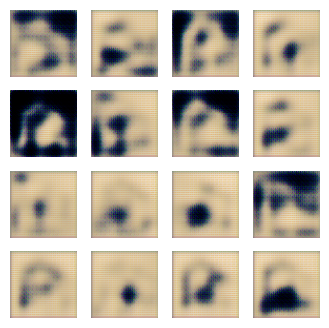

Epoch 12, Gen Loss: 5.4155354499816895, Disc Loss: 0.09853705763816833


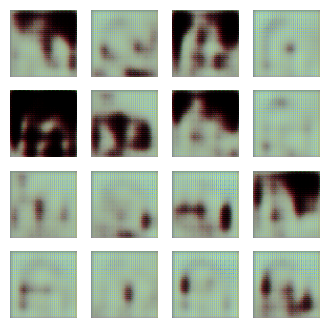

Epoch 13, Gen Loss: 3.848928928375244, Disc Loss: 0.14420798420906067


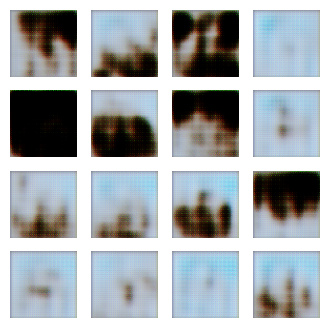

Epoch 14, Gen Loss: 4.182865142822266, Disc Loss: 0.11271153390407562


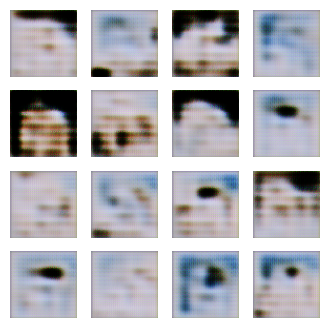

Epoch 15, Gen Loss: 4.951699256896973, Disc Loss: 0.07582587003707886


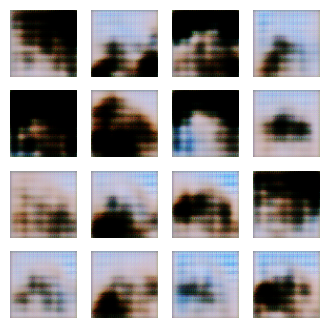

Epoch 16, Gen Loss: 5.763658046722412, Disc Loss: 0.14172972738742828


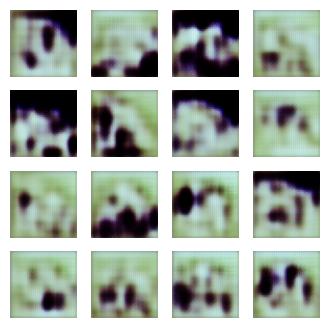

Epoch 17, Gen Loss: 3.5221683979034424, Disc Loss: 0.4478537440299988


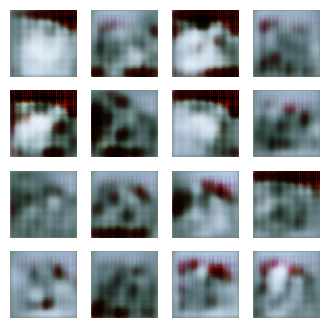

Epoch 18, Gen Loss: 3.122009754180908, Disc Loss: 0.28470346331596375


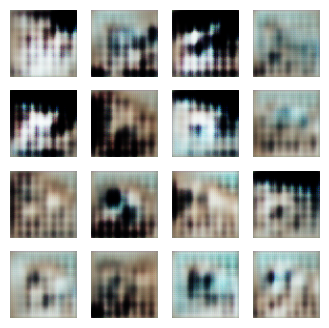

Epoch 19, Gen Loss: 4.470782279968262, Disc Loss: 0.28703147172927856


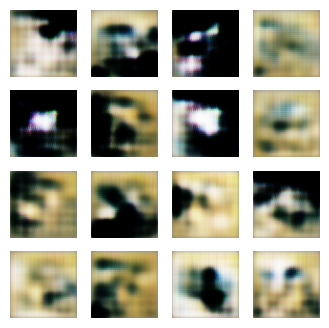

Epoch 20, Gen Loss: 3.9864327907562256, Disc Loss: 0.09135289490222931


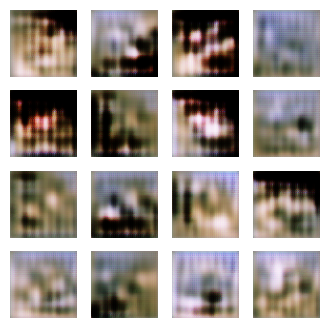

Epoch 21, Gen Loss: 3.5899345874786377, Disc Loss: 0.2738645672798157


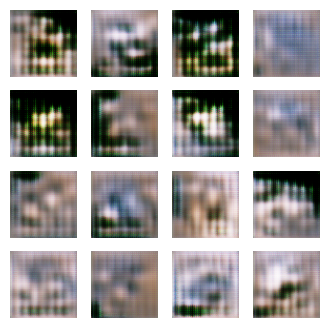

Epoch 22, Gen Loss: 4.015089988708496, Disc Loss: 0.1629125475883484


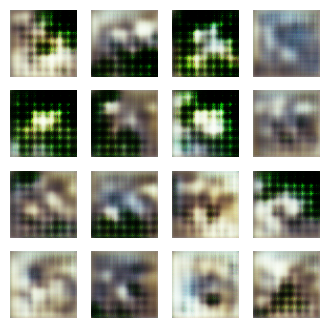

Epoch 23, Gen Loss: 3.059518575668335, Disc Loss: 0.8343088030815125


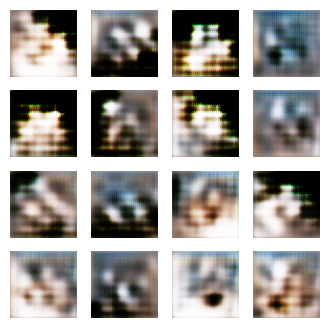

Epoch 24, Gen Loss: 3.7244653701782227, Disc Loss: 0.20380617678165436


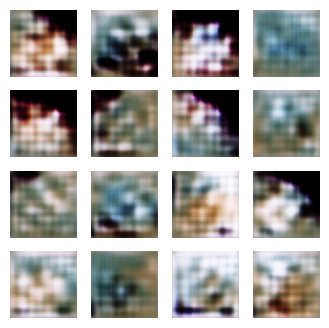

Epoch 25, Gen Loss: 3.3926591873168945, Disc Loss: 0.3282378315925598


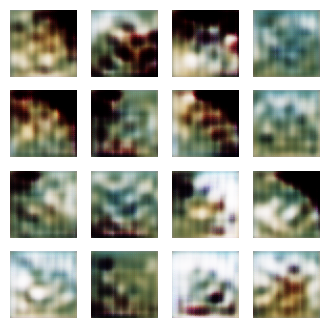

Epoch 26, Gen Loss: 4.241881370544434, Disc Loss: 0.12218962609767914


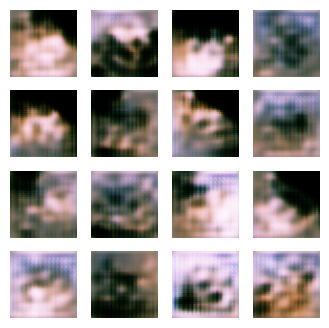

Epoch 27, Gen Loss: 3.900968313217163, Disc Loss: 0.29195696115493774


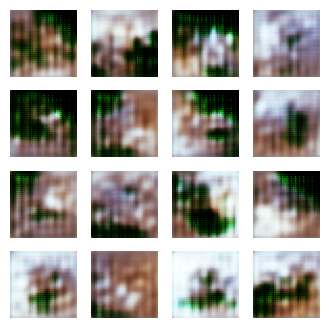

Epoch 28, Gen Loss: 4.966610431671143, Disc Loss: 0.22061631083488464


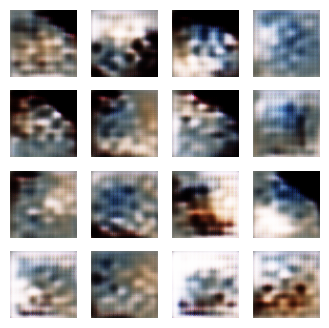

Epoch 29, Gen Loss: 4.194594383239746, Disc Loss: 0.18300822377204895


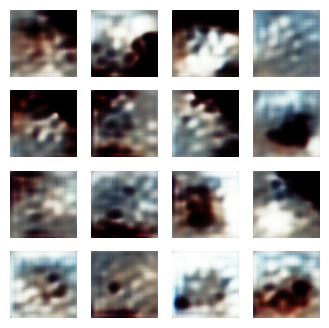

Epoch 30, Gen Loss: 3.4448587894439697, Disc Loss: 0.33168184757232666


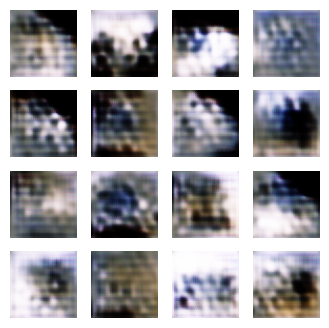

Epoch 31, Gen Loss: 3.6603055000305176, Disc Loss: 0.71816086769104


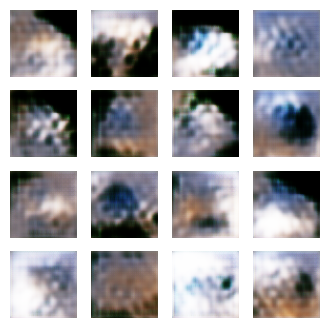

Epoch 32, Gen Loss: 5.138011932373047, Disc Loss: 0.11399772763252258


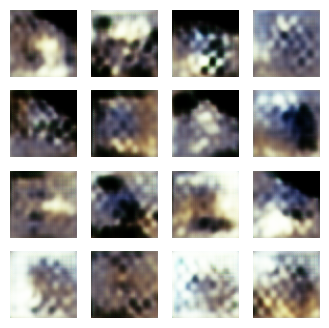

Epoch 33, Gen Loss: 3.82492733001709, Disc Loss: 0.18218600749969482


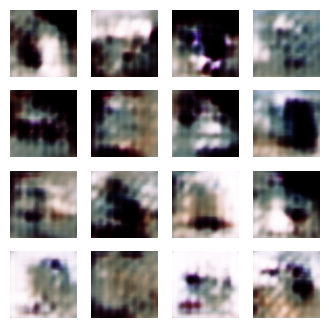

Epoch 34, Gen Loss: 6.4404520988464355, Disc Loss: 0.07906851917505264


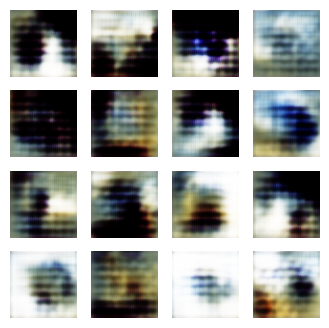

Epoch 35, Gen Loss: 4.949970722198486, Disc Loss: 0.04605904594063759


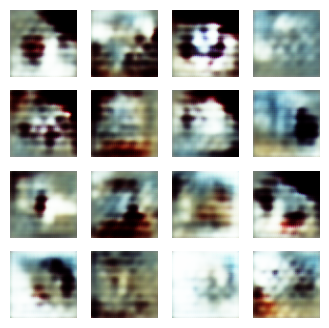

Epoch 36, Gen Loss: 3.435570240020752, Disc Loss: 0.2828456163406372


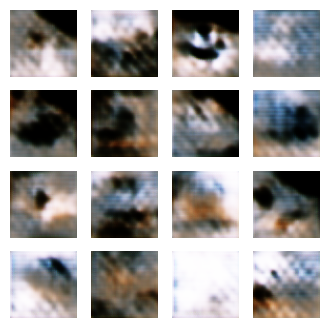

Epoch 37, Gen Loss: 3.3385326862335205, Disc Loss: 0.14036419987678528


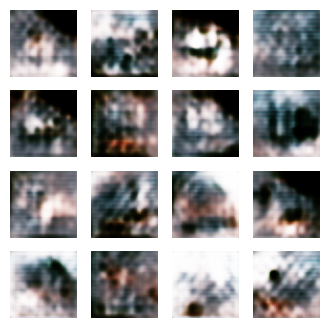

Epoch 38, Gen Loss: 4.796402931213379, Disc Loss: 0.2632424533367157


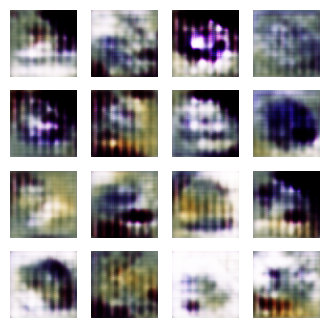

Epoch 39, Gen Loss: 5.374094009399414, Disc Loss: 0.08737503737211227


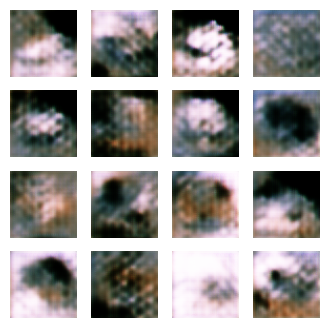

Epoch 40, Gen Loss: 4.025603294372559, Disc Loss: 0.12962022423744202


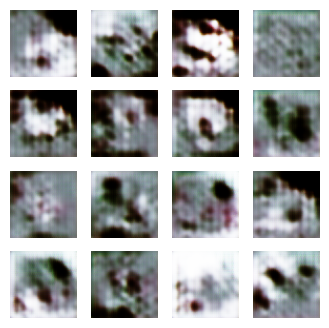

Epoch 41, Gen Loss: 4.482676982879639, Disc Loss: 0.22851897776126862


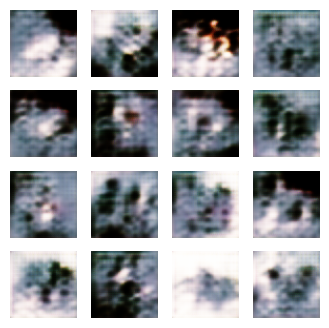

Epoch 42, Gen Loss: 4.452130317687988, Disc Loss: 0.2249383181333542


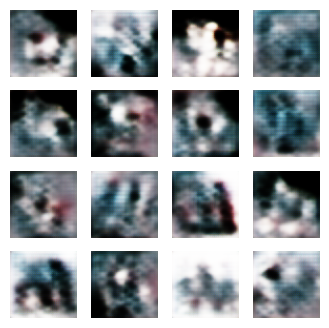

Epoch 43, Gen Loss: 3.9435184001922607, Disc Loss: 0.3153154253959656


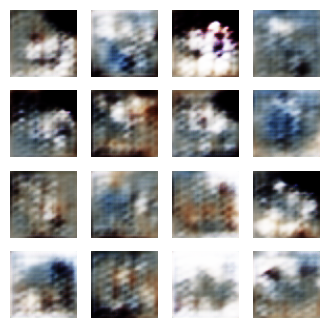

Epoch 44, Gen Loss: 3.7154195308685303, Disc Loss: 0.30661991238594055


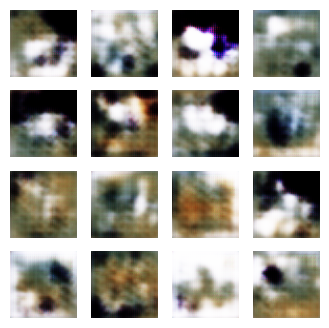

Epoch 45, Gen Loss: 4.816082000732422, Disc Loss: 0.2845650017261505


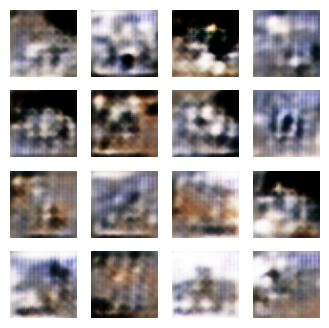

Epoch 46, Gen Loss: 5.484821319580078, Disc Loss: 0.12592031061649323


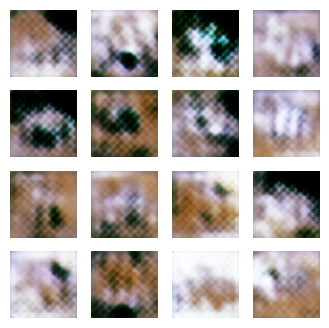

Epoch 47, Gen Loss: 4.671277046203613, Disc Loss: 0.31485021114349365


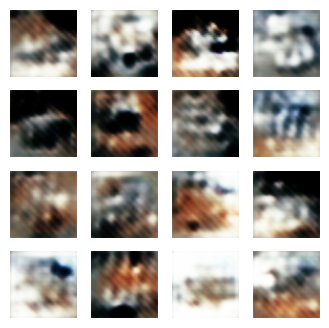

Epoch 48, Gen Loss: 3.22920560836792, Disc Loss: 0.323234885931015


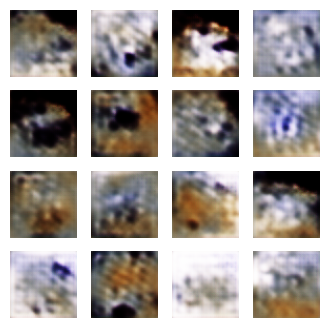

Epoch 49, Gen Loss: 4.729180812835693, Disc Loss: 0.19327302277088165


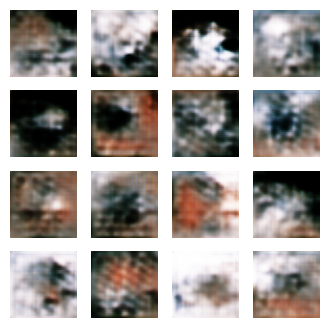

Epoch 50, Gen Loss: 5.031954288482666, Disc Loss: 0.2692115902900696


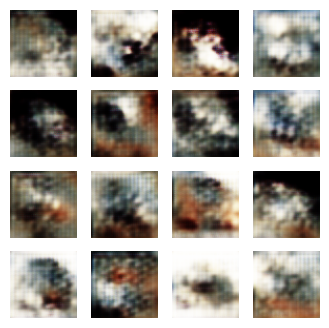

In [10]:
train(train_dataset, EPOCHS)

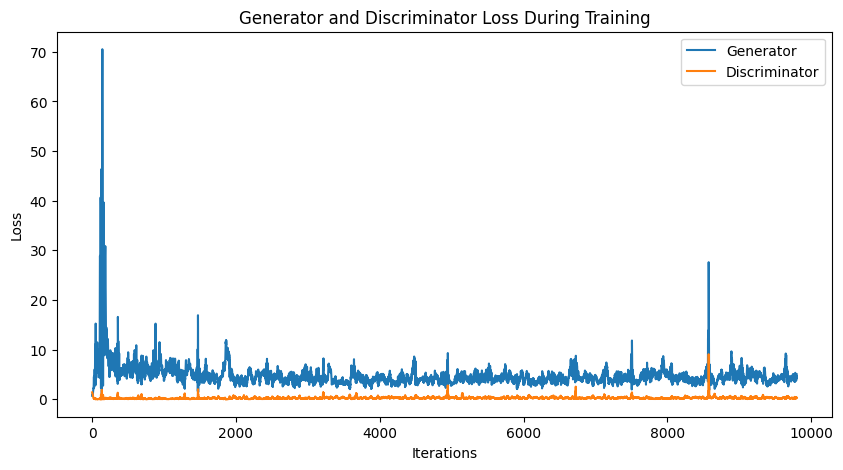

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(gen_losses, label="Generator")
plt.plot(disc_losses, label="Discriminator")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()